
Convolution and Frequency domain Filtering

### Import libraries

In [ ]:
#fp stats and numpy
from PIL import Image #Pillow is used to open , manipulate and save the image in different format, the Image modules is imported to due various types of manipulation to the image
from skimage.io import imread, imshow, show #skimage is collection of algorithms that is used for image processing, skimage.io is used for reading(imread), displaying(imshow), show the plotted image in different screen(show) and saving images and videos
import scipy.fftpack as fp #scipy library function for fast fourier transforms which is used for frequency analysis and filtering the signal and image processing
from scipy import ndimage, misc, signal, stats #ndimage and signal - used for multidimensional image processing, misc- for miscellaneous functions, stats - provide tools for statistical fucntions, probability distributions and hypothesis testing tools
#from scipy.stats import signaltonoise
from skimage import data, img_as_float # data - provides the built-in sample images and datsets, img_as_float - converts the image to floating point representation
from skimage.color import rgb2gray # converts the image (RGB) to grayscale
from skimage.transform import rescale # rescale an image by scaling factor
import matplotlib.pylab as pylab # it combines the functionality of pyplot and numpy
import numpy as np # for the numerial computations on arrays
import numpy.fft # functions for performing fast fourier transform - frequncy domain analysis
import timeit # used for measuring the execution time of code
import imageio # used for reading and write images in various formats (png, jpeg,gif,tiff and video)
from scipy.signal.windows import gaussian # generates a gaussian window

In [ ]:
def signaltonoise(a, axis=0, ddof=0): # a is the input array, axis = 0
    a = np.asanyarray(a)
    m = a.mean(axis) #mean value of array a along the axis = 0, which represents the signals
    sd = a.std(axis=axis, ddof=ddof) # used to represnt the noise int the data
    return np.where(sd == 0, 0, m/sd) # where function is used handle the case when standard deviation is zero, the function
                                    # should return 0(as the SNR is undefined or infinite as sd is in denominator) otherwiae it should return
                                    # the m/sd -- which is the signal to noise ratio

### Frequency domain Gaussian blur filter with numpy fft

<ipython-input-5-266dd2654dcd>:15: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.subplot(2,3,4), pylab.imshow( (20*np.log10( 0.1 + fp.fftshift(freq))).astype(int))
<ipython-input-5-266dd2654dcd>:18: ComplexWarning: Casting complex values to real discards the imaginary part
  fp.fftshift(freq_kernel))).astype(int))
<ipython-input-5-266dd2654dcd>:20: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.imshow( (20*np.log10( 0.1 + fp.fftshift(convolved))).astype(int))


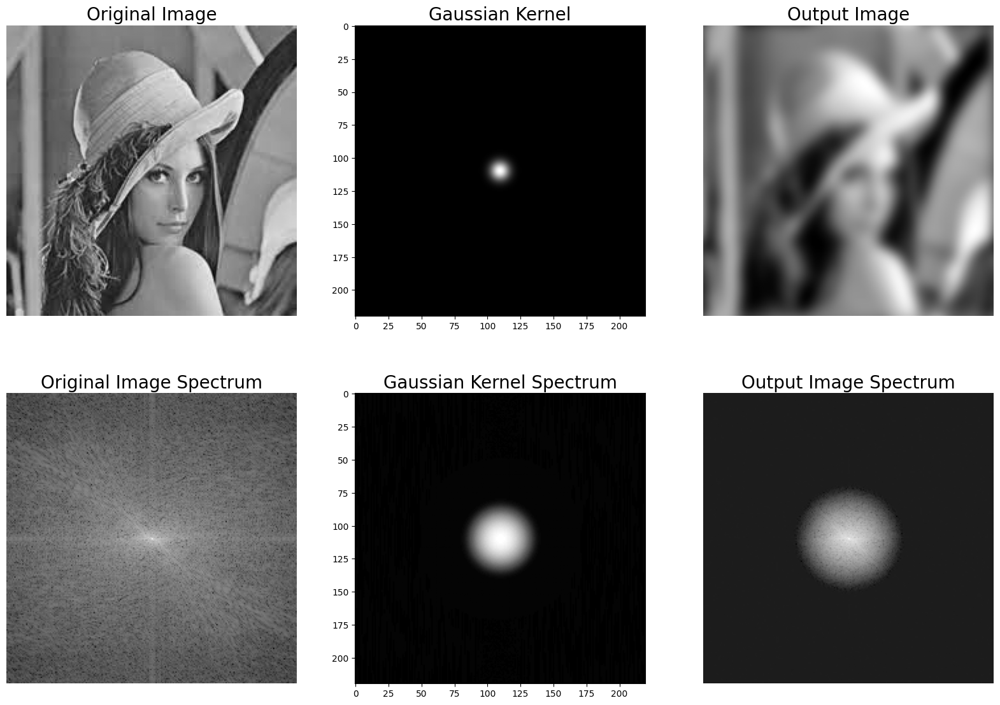

In [ ]:
pylab.figure(figsize=(20,15)) # generate the figure of size 20x15 inches
pylab.gray() # show the filtered result in grayscale
im = np.mean(imread('lena.jpg'), axis=2) # read the image and convert to grayscale from RGB by averaging the three channels
'''create a 2D gaussian filter kernel using the outer product of two 1D gaussian distributions
  gaussian(M,std) M: 1D gaussian window - the length equal to the image height
  std: standard deviation determines the amount of blurring
  these are working independently in horizontal and vertical directions'''
gauss_kernel = np.outer(gaussian(im.shape[0], 5), gaussian(im.shape[1], 5))
freq = fp.fft2(im) # fourier tranform of the image
assert(freq.shape == gauss_kernel.shape) # ensure that the shape of the gaussian kernel is same as the shape of the frequency domain representation
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel)) # fourier tranform of the gaussian kernel after shifting it to the center
convolved = freq*freq_kernel # by the convolution theorem, simply multiply(element-wise multiplication) in the frequency domain
im1 = fp.ifft2(convolved).real # compute the inverse fourier tranform to obatian the filtered image

pylab.subplot(2,3,1), pylab.imshow(im), pylab.title('Original Image',size=20), pylab.axis('off')
pylab.subplot(2,3,2), pylab.imshow(gauss_kernel), pylab.title('Gaussian Kernel', size=20)
#plot of the filtered output image
pylab.subplot(2,3,3), pylab.imshow(im1) # the imaginary part is an artifact
pylab.title('Output Image', size=20), pylab.axis('off')
pylab.subplot(2,3,4), pylab.imshow( (20*np.log10( 0.1 + fp.fftshift(freq))).astype(int))
pylab.title('Original Image Spectrum', size=20), pylab.axis('off')
'''why log10 is used?
  fourier tranform often have dynamic range(some values are very large as compared to others)
  applying the log10() makes the details more visible by compressing the high values and amplify the smaller values
  0.1+ is added to avoid log(0), which is undefined'''
# fp.fftshift() .. is used to reorder the fourier transform so that the zero frequency component is at the center as by default the low frequencies are at the corners after fft2()
# 20 * np.log10(...) .. is used to convert the frequency specturn to decibels(dB) this is a standard practice in signal processing to display spectral magnitudes,
# the factor of 20 is used because we are working with power spectra
# .astype(int) - extracts the real part and converts to integer for display
pylab.subplot(2,3,5), pylab.imshow( (20*np.log10( 0.1 +fp.fftshift(freq_kernel))).astype(int))
pylab.title('Gaussian Kernel Spectrum', size=20), pylab.subplot(2,3,6)
pylab.imshow( (20*np.log10( 0.1 + fp.fftshift(convolved))).astype(int)) # similary the guassian kernel spectrum
pylab.title('Output Image Spectrum', size=20), pylab.axis('off')
pylab.subplots_adjust(wspace=0.2, hspace=0)
pylab.show()

### Gaussian kernel in the frequency domain

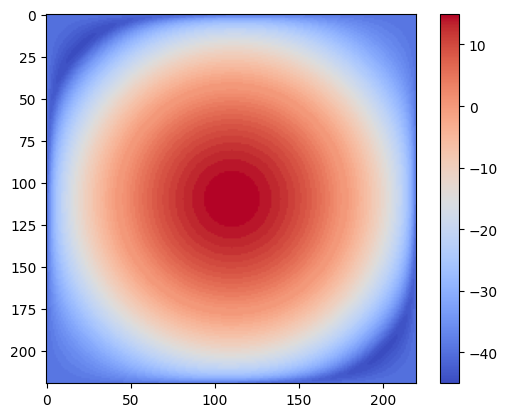

In [ ]:
im = rgb2gray(imread('lena.jpg')) #loads the image as an array and then converts the rgn image to grayscale
gauss_kernel = np.outer(gaussian(im.shape[0], 1),gaussian(im.shape[1], 1)) # the gaussian kernel is a 2D gaussain filter with std 1
freq = fp.fft2(im) # 2D fast fourirer tranform, frequency representation of the image
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel)) # fourier transform of the gaussain filter
pylab.imshow( (20*np.log10( 0.01 +fp.fftshift(freq_kernel))).real.astype(int), cmap='coolwarm') # 0.01 is added to keep the argument to log function always positive
# cool-warm colormap is used for visualization
pylab.colorbar()
pylab.show()

### Frequency domain Gaussian blur filter with scipy signal fftconvolve()

(224, 225)


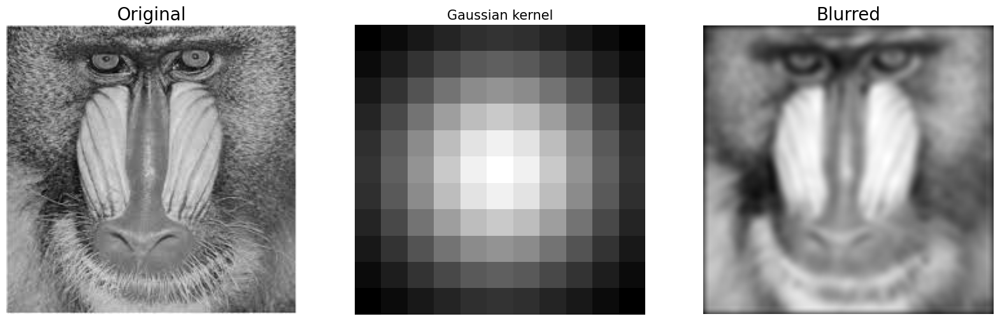

In [ ]:
# Read the image and convert it to grayscale by averaging the RGB channels
im = np.mean(imread('mandrill.jpg'), axis=2)
print(im.shape)  # Print the image shape (Height, Width)
# (224, 225)
# Create a 2D Gaussian kernel using an outer product of two 1D Gaussian distributions
# The kernel size is 11x11, and the standard deviation (σ) is set to 3
gauss_kernel = np.outer(gaussian(11, 3), gaussian(11, 3)) # 2D Gaussian kernel of size 11x11 with σ = 3
# Apply Gaussian blur using FFT-based convolution
# FFT convolution is generally faster than direct convolution, especially for large images
im_blurred = signal.fftconvolve(im, gauss_kernel, mode='same')
# Create a figure with three subplots to visualize the original image, the Gaussian kernel, and the blurred image
fig, (ax_original, ax_kernel, ax_blurred) = pylab.subplots(1, 3, figsize=(20,8))
ax_original.imshow(im, cmap='gray')
ax_original.set_title('Original', size=20)
ax_original.set_axis_off()
ax_kernel.imshow(gauss_kernel)
ax_kernel.set_title('Gaussian kernel', size=15)
ax_kernel.set_axis_off()
ax_blurred.imshow(im_blurred, cmap='gray')
ax_blurred.set_title('Blurred', size=20)
ax_blurred.set_axis_off()
fig.show()

<ipython-input-18-dc027c8fa2a3>:5: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.subplot(1,2,1), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=pylab.cm.gray)
<ipython-input-18-dc027c8fa2a3>:9: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.subplot(1,2,2), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=pylab.cm.gray)


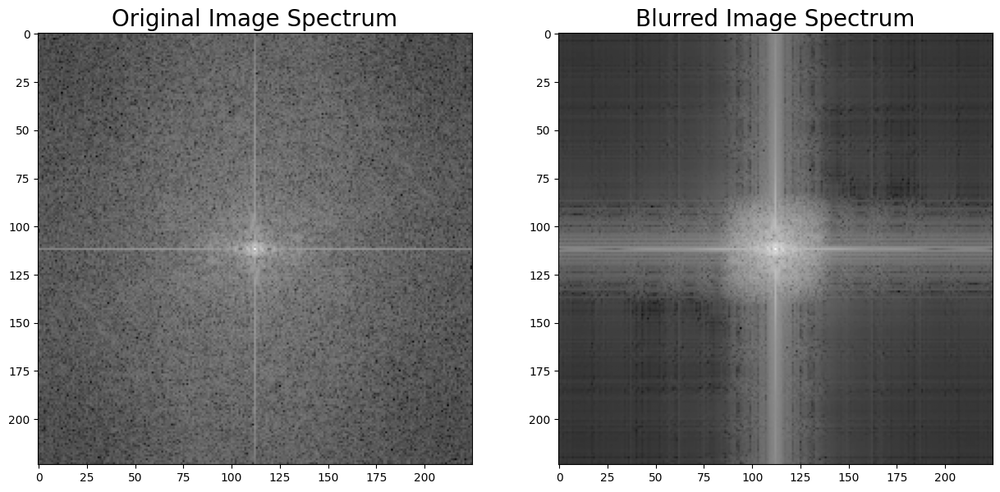

In [ ]:
# Compute the 2D Fast Fourier Transform (FFT) of the original grayscale image
F1 = fftpack.fft2((im).astype(float))  # Convert image to float before applying FFT
F2 = fftpack.fftshift( F1 ) # Shift the zero-frequency component to the center of the spectrum
pylab.figure(figsize=(15,8)) # Create a figure to display the frequency spectrum
pylab.subplot(1,2,1), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=pylab.cm.gray) # Plot the frequency spectrum of the original image
pylab.title('Original Image Spectrum', size=20)
F1 = fftpack.fft2((im_blurred).astype(float)) # Compute the 2D FFT of the blurred image
F2 = fftpack.fftshift( F1 ) # Shift the zero-frequency component to the center
pylab.subplot(1,2,2), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=pylab.cm.gray)
pylab.title('Blurred Image Spectrum', size=20)
pylab.show()

### Comparing the runtimes of SciPy convolve() and fftconvolve() with the Gaussian blur kernel

(224, 225)


(<Axes: title={'center': 'ffconvolve Output'}>,
 Text(0.5, 1.0, 'ffconvolve Output'),
 (-0.5, 224.5, 223.5, -0.5))

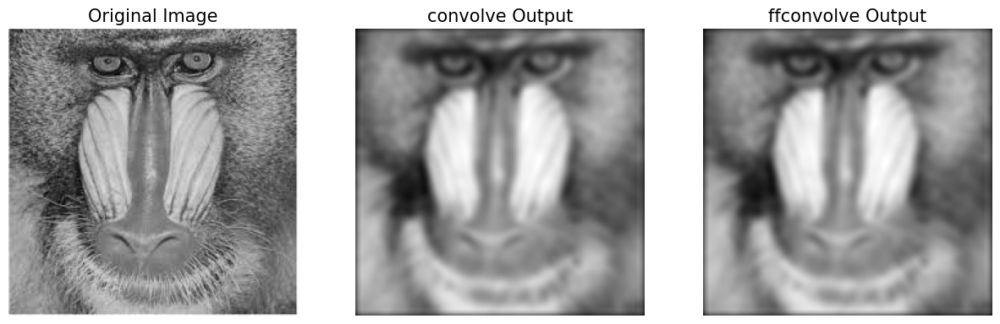

In [ ]:
im = np.mean(imread('mandrill.jpg'), axis=2) # convert the image to grayscale
print(im.shape)
# (224, 225)
gauss_kernel = np.outer(gaussian(11, 3), gaussian(11, 3)) # 2D Gaussian kernel of size 11x11 with σ = 3
im_blurred1 = signal.convolve(im, gauss_kernel, mode="same") # the direct spatial convolution directly in the time domain
im_blurred2 = signal.fftconvolve(im, gauss_kernel, mode='same') # fast fourier transformation is used for convolution for faster performance on large images/kernels
'''takes the convolution function and returns a wrapped function that applies'''
def wrapper_convolve(func):
    def wrapped_convolve():
        return func(im, gauss_kernel, mode="same")  # Apply the given convolution function
    return wrapped_convolve  # Return the wrapped function

# Create wrapped versions of both convolution functions for benchmarking
wrapped_convolve = wrapper_convolve(signal.convolve)
wrapped_fftconvolve = wrapper_convolve(signal.fftconvolve)

# Measure execution time for direct spatial convolution (convolve)
times1 = timeit.repeat(wrapped_convolve, number=1, repeat=100)
# Measure execution time for FFT-based convolution (fftconvolve)
times2 = timeit.repeat(wrapped_fftconvolve, number=1, repeat=100)
pylab.figure(figsize=(15,5))
pylab.gray()
pylab.subplot(131), pylab.imshow(im), pylab.title('Original Image',size=15), pylab.axis('off')
pylab.subplot(132), pylab.imshow(im_blurred1), pylab.title('convolve Output', size=15), pylab.axis('off')
pylab.subplot(133), pylab.imshow(im_blurred2), pylab.title('ffconvolve Output', size=15),pylab.axis('off')

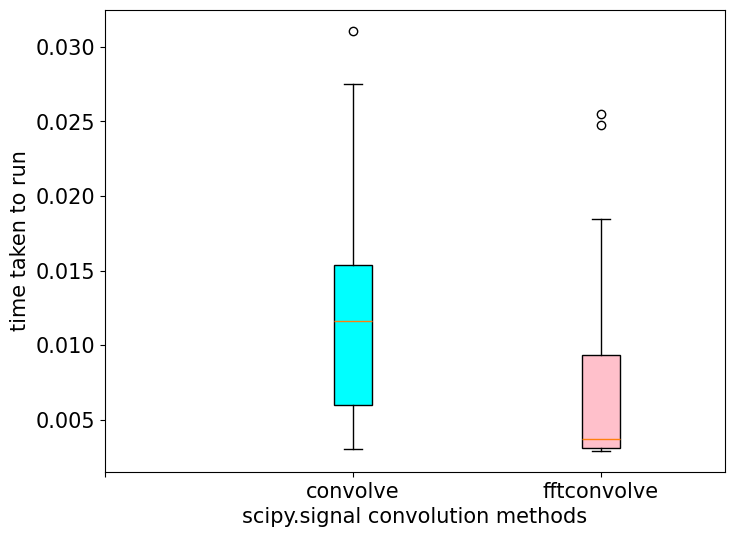

In [ ]:
data = [times1, times2]   # Store execution times of both convolution methods in a list
pylab.figure(figsize=(8,6))
# Generate a box plot to compare execution times
box = pylab.boxplot(data, patch_artist=True) #notch=True,  # patch_artist=True allows coloring the boxes
colors = ['cyan', 'pink']
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)
pylab.xticks(np.arange(3), ('', 'convolve', 'fftconvolve'), size=15)
pylab.yticks(fontsize=15)
pylab.xlabel('scipy.signal convolution methods', size=15)
pylab.ylabel('time taken to run', size = 15)
pylab.show()


'''the box for fftconvolve is lower than the box for convolve, the FFT-based convolution is generally faster.
  fftconvolve has a tighter box (less spread), it means it's more consistent in execution time.
  convolve has higher median and a larger spread, it suggests that it is slower and more variable than fftconvolve'''

### High-Pass Filter (HPF)

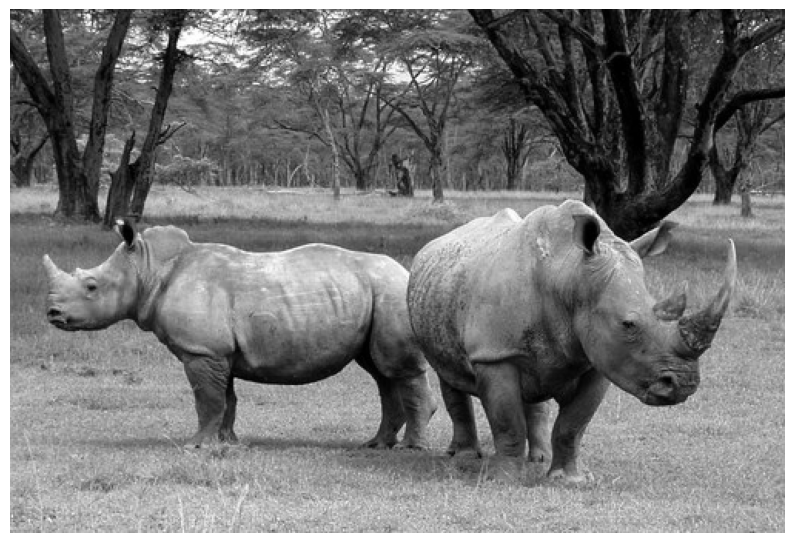

(<Figure size 1000x1000 with 1 Axes>,
 (-0.5, 502.5, 339.5, -0.5),
 None)

In [ ]:
im = np.array(Image.open('rhino.jpg').convert('L'))
pylab.figure(figsize=(10,10)), pylab.imshow(im, cmap=pylab.cm.gray), pylab.axis('off'), pylab.show()

C:\Users\hp\AppData\Local\Temp\ipykernel_40516\575726222.py:6: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.figure(figsize=(10,10)), pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int)), pylab.show()


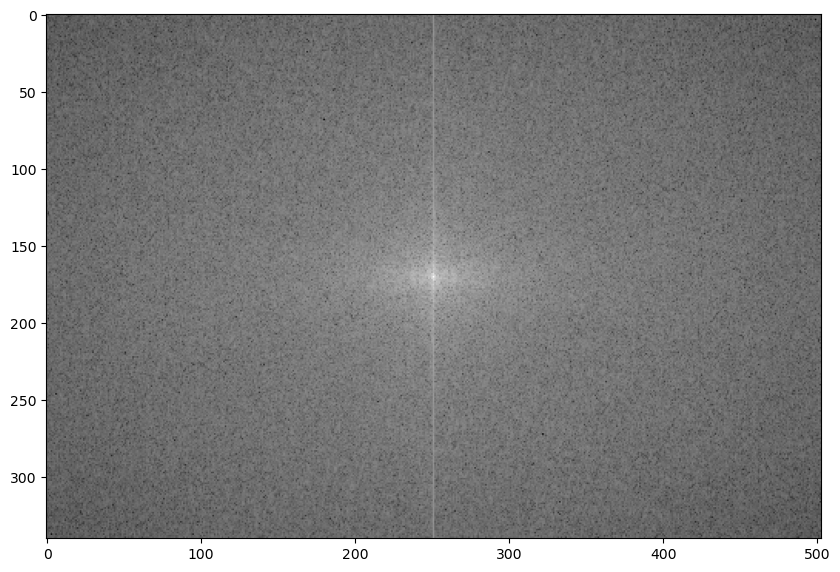

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [ ]:
freq = fp.fft2(im)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
freq1 = np.copy(freq)
freq2 = fp.fftshift(freq1)
pylab.figure(figsize=(10,10)), pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int)), pylab.show()

C:\Users\hp\AppData\Local\Temp\ipykernel_40516\3511157418.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int))


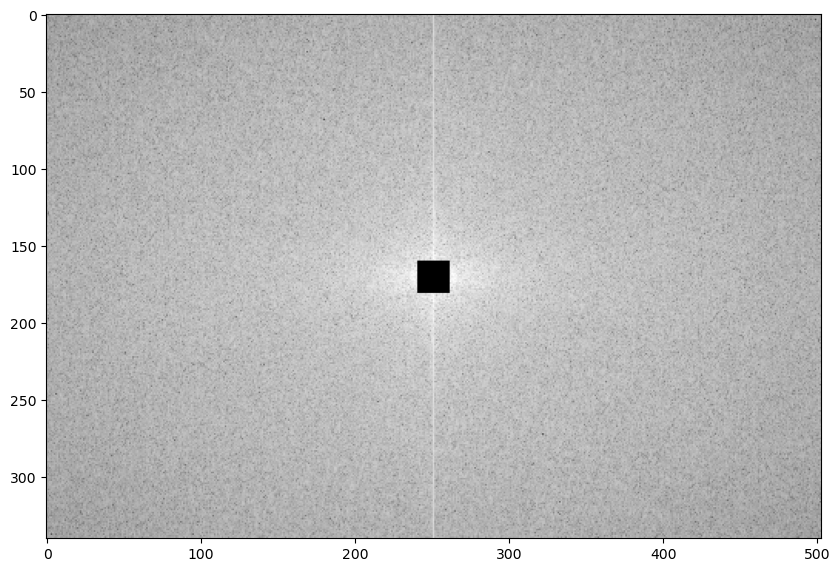

In [ ]:
# apply HPF
freq2[half_w-10:half_w+11,half_h-10:half_h+11] = 0 # select all but the first 20x20 (low) frequencies
pylab.figure(figsize=(10,10))
pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int))
pylab.show()

0.5900939025690546


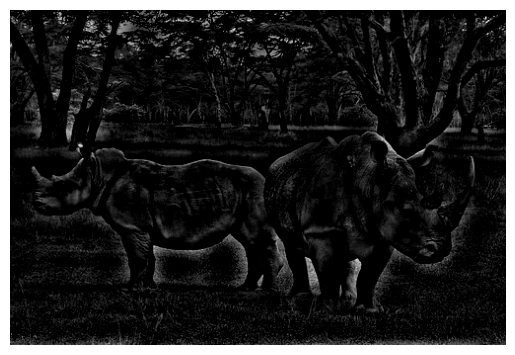

(<matplotlib.image.AxesImage at 0x2baeba6a850>,
 (-0.5, 502.5, 339.5, -0.5),
 None)

In [ ]:
im1 = np.clip(fp.ifft2(fftpack.ifftshift(freq2)).real,0,255) # clip pixel values after IFFT
print(signaltonoise(im1, axis=None))
# 0.5901647786775175
pylab.imshow(im1, cmap='gray'), pylab.axis('off'), pylab.show()

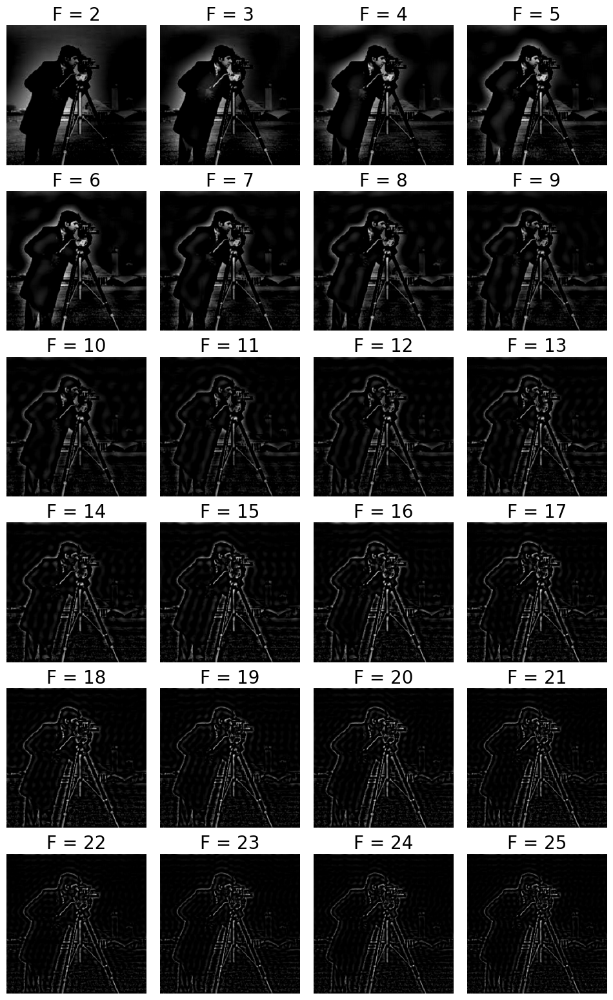

In [ ]:
from scipy import fftpack
im = np.array(Image.open('images/cameraman.jpg').convert('L'))
freq = fp.fft2(im)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
snrs_hp = []
lbs = list(range(1,25))
pylab.figure(figsize=(12,20))
for l in lbs:
    freq1 = np.copy(freq)
    freq2 = fftpack.fftshift(freq1)
    freq2[half_w-l:half_w+l+1,half_h-l:half_h+l+1] = 0 # select all but the first lxl (low) frequencies
    im1 = np.clip(fp.ifft2(fftpack.ifftshift(freq2)).real,0,255) # clip pixel values after IFFT
    snrs_hp.append(signaltonoise(im1, axis=None))
    pylab.subplot(6,4,l), pylab.imshow(im1, cmap='gray'), pylab.axis('off')
    pylab.title('F = ' + str(l+1), size=20)
pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

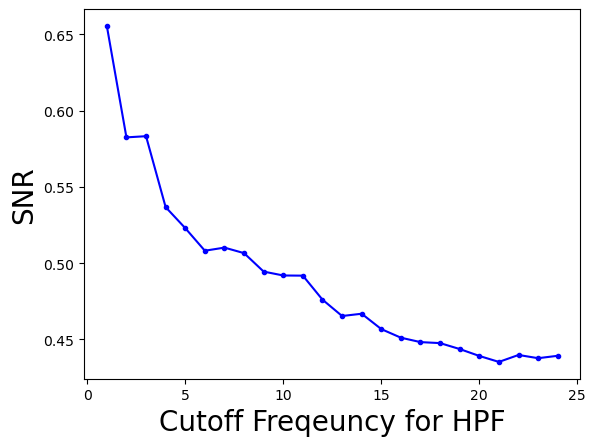

In [ ]:
pylab.plot(lbs, snrs_hp, 'b.-')
pylab.xlabel('Cutoff Freqeuncy for HPF', size=20)
pylab.ylabel('SNR', size=20)
pylab.show()

### Low-pass filter (LPF)

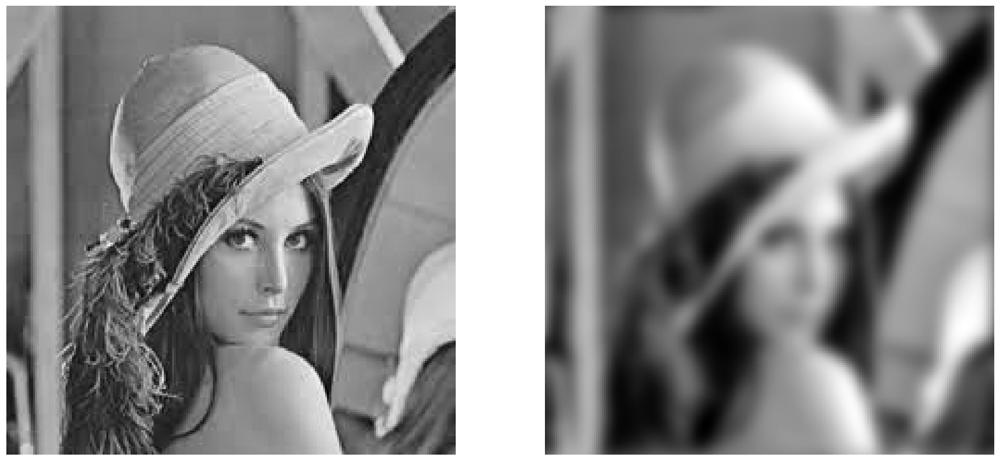

In [ ]:
import numpy.fft as fp
fig, (axes1, axes2) = pylab.subplots(1, 2, figsize=(20,10))
pylab.gray() # show the result in grayscale
im = np.mean(imread('images/lena.jpg'), axis=2)
freq = fp.fft2(im)
freq_gaussian = ndimage.fourier_gaussian(freq, sigma=4)
im1 = fp.ifft2(freq_gaussian)
axes1.imshow(im), axes1.axis('off'), axes2.imshow(im1.real) # the imaginary part is an artifact
axes2.axis('off')
pylab.show()

C:\Users\hp\AppData\Local\Temp\ipykernel_40516\706543968.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  numpy.fft.fftshift(freq_gaussian))).astype(int))


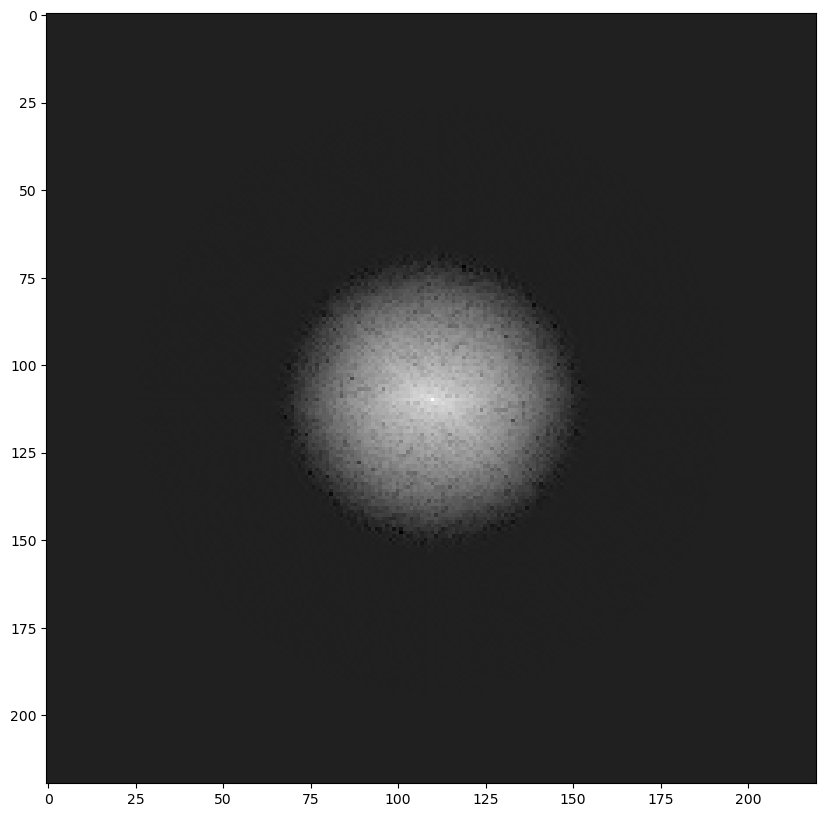

In [ ]:
pylab.figure(figsize=(10,10))
pylab.imshow( (20*np.log10( 0.1 +
numpy.fft.fftshift(freq_gaussian))).astype(int))
pylab.show()

2.3991879574241466


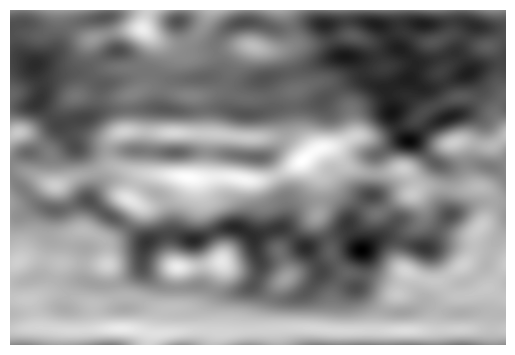

C:\Users\hp\AppData\Local\Temp\ipykernel_40516\3921376465.py:18: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int))


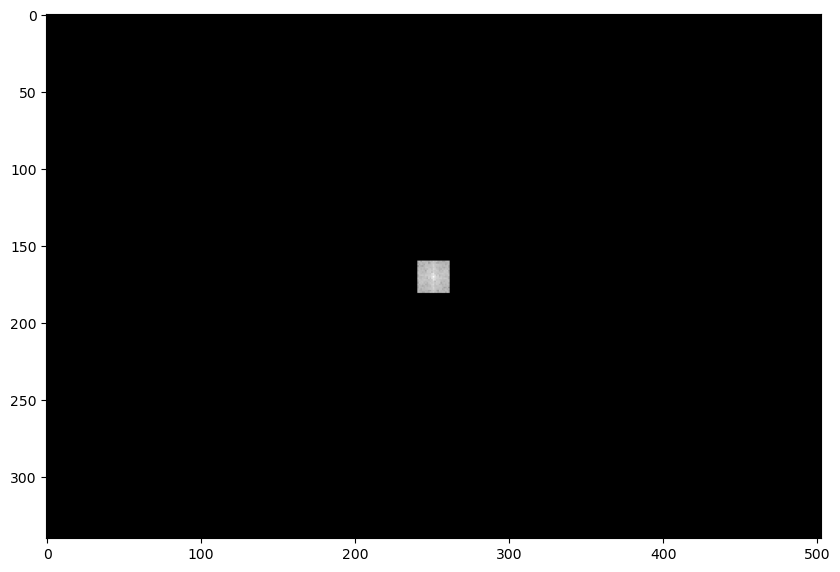

In [ ]:
from scipy import fftpack
im = np.array(Image.open('images/rhino.jpg').convert('L'))
# low pass filter
freq = fp.fft2(im)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
freq1 = np.copy(freq)
freq2 = fftpack.fftshift(freq1)
freq2_low = np.copy(freq2)
freq2_low[half_w-10:half_w+11,half_h-10:half_h+11] = 0 # block the lowfrequencies
freq2 -= freq2_low # select only the first 20x20 (low) frequencies, block the high frequencies
im1 = fp.ifft2(fftpack.ifftshift(freq2)).real
print(signaltonoise(im1, axis=None))
# 2.389151856495427
pylab.imshow(im1, cmap='gray'), pylab.axis('off')
pylab.show()
pylab.figure(figsize=(10,10))
pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int))
pylab.show()

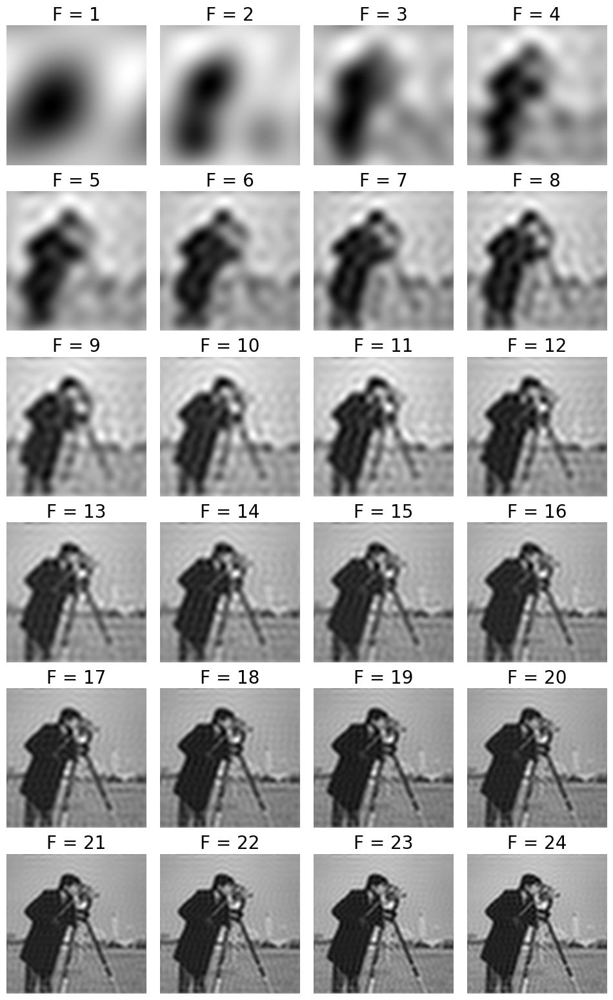

In [ ]:
im = np.array(Image.open('images/cameraman.jpg').convert('L'))
freq = fp.fft2(im)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
snrs_lp = []
ubs = list(range(1,25))
pylab.figure(figsize=(12,20))
for u in ubs:
    freq1 = np.copy(freq)
    freq2 = fftpack.fftshift(freq1)
    freq2_low = np.copy(freq2)
    freq2_low[half_w-u:half_w+u+1,half_h-u:half_h+u+1] = 0
    freq2 -= freq2_low # select only the first 20x20 (low) frequencies
    im1 = fp.ifft2(fftpack.ifftshift(freq2)).real
    snrs_lp.append(signaltonoise(im1, axis=None))
    pylab.subplot(6,4,u), pylab.imshow(im1, cmap='gray'), pylab.axis('off')
    pylab.title('F = ' + str(u), size=20)
pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

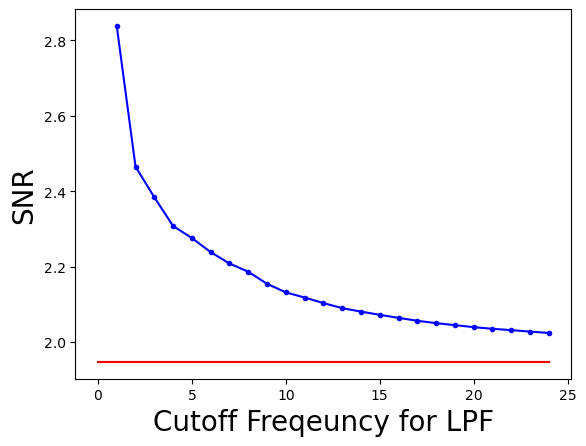

In [ ]:
snr = signaltonoise(im, axis=None)
pylab.plot(ubs, snrs_lp, 'b.-')
pylab.plot(range(25), [snr]*25, 'r-')
pylab.xlabel('Cutoff Freqeuncy for LPF', size=20)
pylab.ylabel('SNR', size=20)
pylab.show()

### Band-pass filter (BPF) with DoG

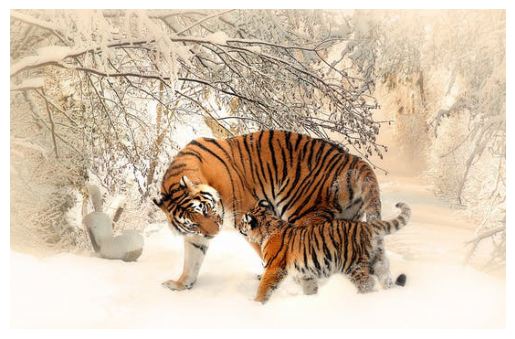

0.7862192363545746


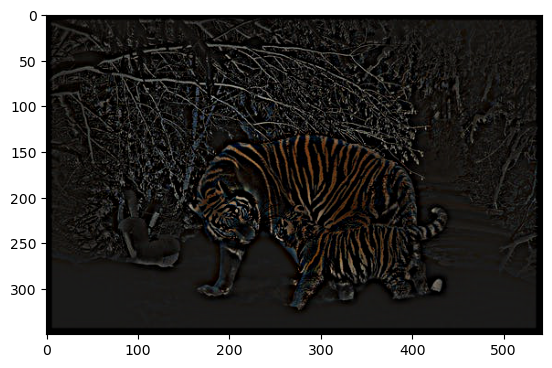

In [ ]:
from skimage import img_as_float
im = img_as_float(pylab.imread('images/tigers.jpeg'))
pylab.figure(), pylab.imshow(im), pylab.axis('off'), pylab.show()
x = np.linspace(-10, 10, 15)
kernel_1d = np.exp(-0.005*x**2)
kernel_1d /= np.trapz(kernel_1d) # normalize the sum to 1
gauss_kernel1 = kernel_1d[:, np.newaxis] * kernel_1d[np.newaxis, :]
kernel_1d = np.exp(-5*x**2)
kernel_1d /= np.trapz(kernel_1d) # normalize the sum to 1
gauss_kernel2 = kernel_1d[:, np.newaxis] * kernel_1d[np.newaxis, :]
DoGKernel = gauss_kernel1[:, :, np.newaxis] - gauss_kernel2[:, :, np.newaxis]
im = signal.fftconvolve(im, DoGKernel, mode='same')
pylab.figure(), pylab.imshow(np.clip(im, 0, 1)), print(np.max(im)),
pylab.show()

### Band-stop (notch) filter

(340, 453)


C:\Users\hp\AppData\Local\Temp\ipykernel_40516\1254817603.py:9: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.subplot(2,2,2), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=pylab.cm.gray)
C:\Users\hp\AppData\Local\Temp\ipykernel_40516\1254817603.py:20: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.subplot(2,2,4), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=pylab.cm.gray)


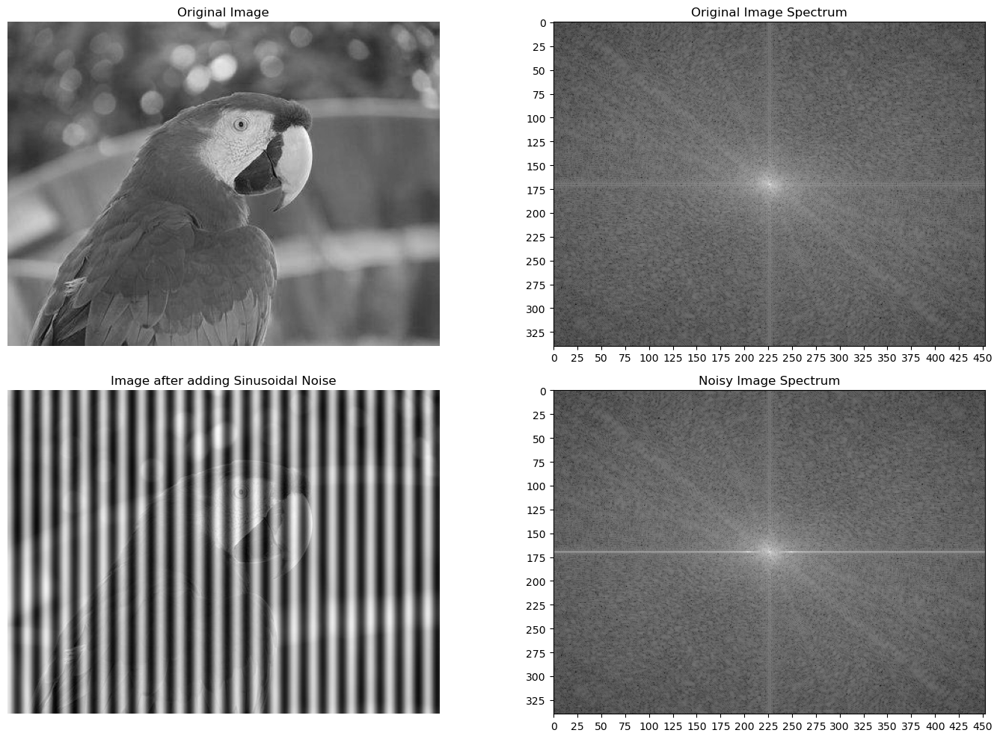

In [ ]:
from scipy import fftpack
pylab.figure(figsize=(15,10))
im =  np.mean(imread("images/parrot.png"), axis=2) / 255
print(im.shape)
pylab.subplot(2,2,1), pylab.imshow(im, cmap='gray'), pylab.axis('off')
pylab.title('Original Image')
F1 = fftpack.fft2((im).astype(float))
F2 = fftpack.fftshift( F1 )
pylab.subplot(2,2,2), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=pylab.cm.gray)
pylab.xticks(np.arange(0, im.shape[1], 25))
pylab.yticks(np.arange(0, im.shape[0], 25))
pylab.title('Original Image Spectrum')
# add periodic noise to the image
for n in range(im.shape[1]):
    im[:, n] += np.cos(0.1*np.pi*n)
pylab.subplot(2,2,3), pylab.imshow(im, cmap='gray'), pylab.axis('off')
pylab.title('Image after adding Sinusoidal Noise')
F1 = fftpack.fft2((im).astype(float)) # noisy spectrum
F2 = fftpack.fftshift( F1 )
pylab.subplot(2,2,4), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int), cmap=pylab.cm.gray)
pylab.xticks(np.arange(0, im.shape[1], 25))
pylab.yticks(np.arange(0, im.shape[0], 25))
pylab.title('Noisy Image Spectrum')
pylab.tight_layout()
pylab.show()

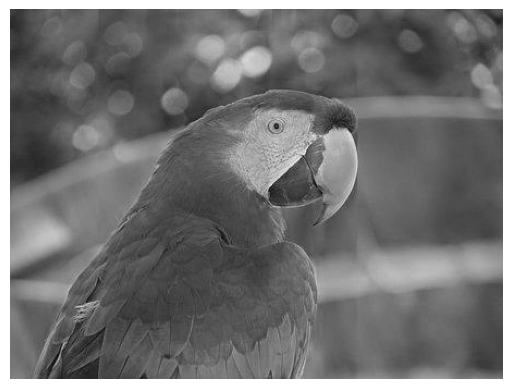

((0.0, 1.0, 0.0, 1.0), <matplotlib.image.AxesImage at 0x2baefaa6610>, None)

In [ ]:
F2[170:176,:220] = F2[170:176,230:] = 0 # eliminate the frequencies most likely responsible for noise (keep some low frequency components)
im1 = fftpack.ifft2(fftpack.ifftshift( F2 )).real
pylab.axis('off'), pylab.imshow(im1, cmap='gray'), pylab.show()

### Image restoration

In [ ]:
im = 255*rgb2gray(imread('images/lena.jpg'))
gauss_kernel = np.outer(signal.gaussian(im.shape[0], 3),
signal.gaussian(im.shape[1], 3))
freq = fp.fft2(im)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel)) # this is our H
convolved = freq*freq_kernel # by convolution theorem
im_blur = fp.ifft2(convolved).real
im_blur = 255 * im_blur / np.max(im_blur) # normalize

C:\Users\hp\AppData\Local\Temp\ipykernel_40516\450770443.py:2: DeprecationWarning: Importing gaussian from 'scipy.signal' is deprecated and will raise an error in SciPy 1.13.0. Please use 'scipy.signal.windows.gaussian' or the convenience function 'scipy.signal.get_window' instead.
  gauss_kernel = np.outer(signal.gaussian(im.shape[0], 3),
C:\Users\hp\AppData\Local\Temp\ipykernel_40516\450770443.py:3: DeprecationWarning: Importing gaussian from 'scipy.signal' is deprecated and will raise an error in SciPy 1.13.0. Please use 'scipy.signal.windows.gaussian' or the convenience function 'scipy.signal.get_window' instead.
  signal.gaussian(im.shape[1], 3))


243.7587 255.0


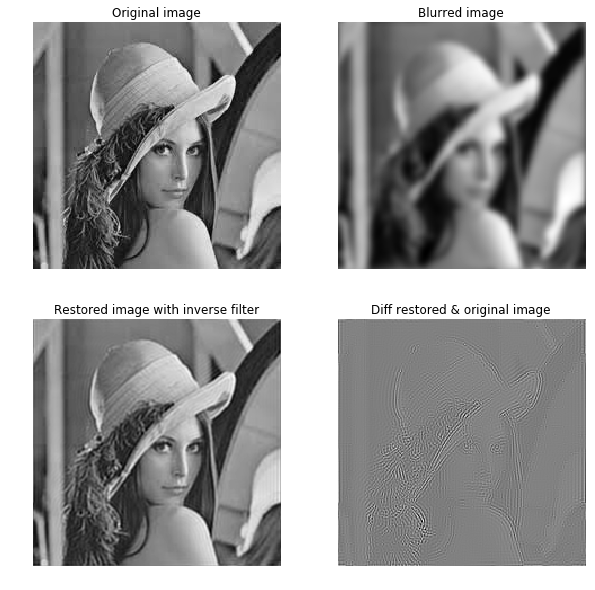

In [ ]:
epsilon = 10**-6
freq = fp.fft2(im_blur)
freq_kernel = 1 / (epsilon + freq_kernel) # avoid division by zero
convolved = freq*freq_kernel
im_restored = fp.ifft2(convolved).real
im_restored = 255 * im_restored / np.max(im_restored)
print(np.max(im), np.max(im_restored))
pylab.figure(figsize=(10,10))
pylab.gray()
pylab.subplot(221), pylab.imshow(im), pylab.title('Original image'), pylab.axis('off')
pylab.subplot(222), pylab.imshow(im_blur), pylab.title('Blurred image'), pylab.axis('off')
pylab.subplot(223), pylab.imshow(im_restored), pylab.title('Restored image with inverse filter'), pylab.axis('off')
pylab.subplot(224), pylab.imshow(im_restored - im), pylab.title('Diff restored & original image'), pylab.axis('off')
pylab.show()

In [ ]:
kernel_size = 21 # a 21 x 21 motion blurred kernel
mblur_kernel = np.zeros((kernel_size, kernel_size))
mblur_kernel[int((kernel_size-1)/2), :] = np.ones(kernel_size)
mblur_kernel = mblur_kernel / kernel_size
# expand the kernel by padding zeros

### Image deconvolution with the Wiener filter

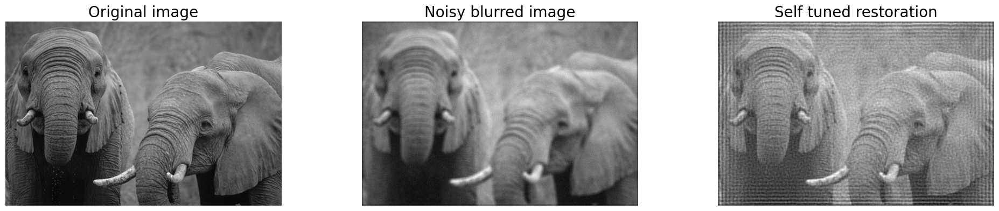

In [ ]:
from skimage import color, data, restoration
im = color.rgb2gray(imread('images/elephant_g.jpg'))
from scipy.signal import convolve2d as conv2
n = 7
psf = np.ones((n, n)) / n**2
im1 = conv2(im, psf, 'same')
im1 += 0.1 * im1.std() * np.random.standard_normal(im1.shape)
im2, _ = restoration.unsupervised_wiener(im1, psf)
fig, axes = pylab.subplots(nrows=1, ncols=3, figsize=(20, 4), sharex=True, sharey=True)
pylab.gray()
axes[0].imshow(im), axes[0].axis('off'), axes[0].set_title('Original image', size=20)
axes[1].imshow(im1), axes[1].axis('off'), axes[1].set_title('Noisy blurred image', size=20)
axes[2].imshow(im2), axes[2].axis('off'), axes[2].set_title('Self tuned restoration', size=20)
fig.tight_layout()
pylab.show()

### Image denoising with FFT

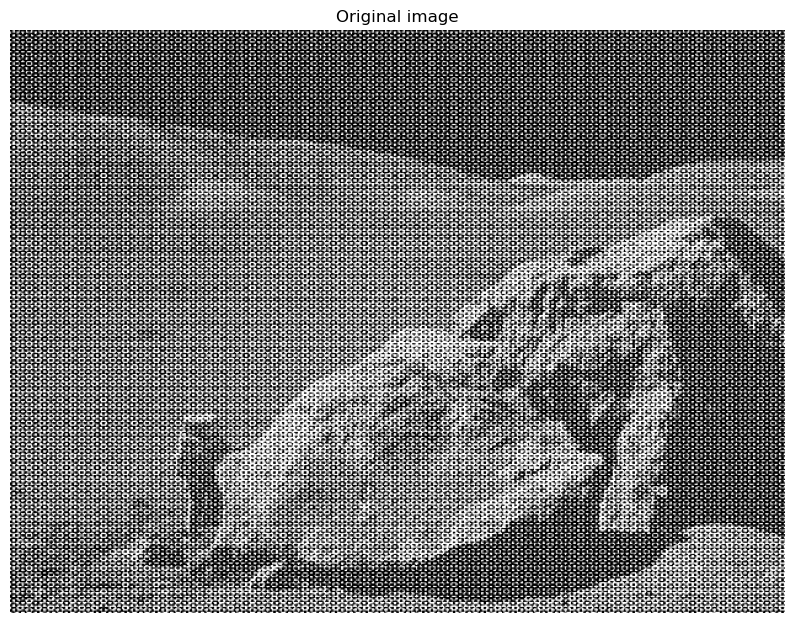

(<matplotlib.image.AxesImage at 0x2baef66d650>,
 (-0.5, 629.5, 473.5, -0.5),
 Text(0.5, 1.0, 'Original image'),
 None)

In [ ]:
im = pylab.imread('images/moonlanding.png').astype(float)
pylab.figure(figsize=(10,10))
pylab.imshow(im, pylab.cm.gray), pylab.axis('off'), pylab.title('Original image'), pylab.show()

Text(0.5, 1.0, 'Spectrum with Fourier transform')

<Figure size 640x480 with 0 Axes>

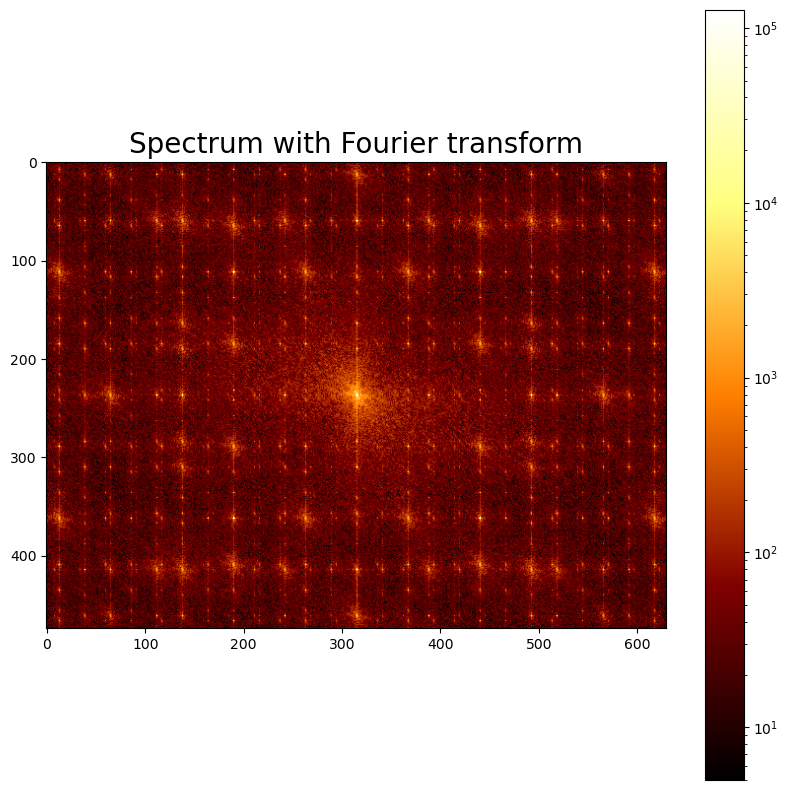

In [ ]:
from scipy import fftpack
from matplotlib.colors import LogNorm
im_fft = fftpack.fft2(im)
def plot_spectrum(im_fft):
    pylab.figure(figsize=(10,10))
    pylab.imshow(np.abs(im_fft), norm=LogNorm(vmin=5), cmap=pylab.cm.afmhot), pylab.colorbar()
pylab.figure(), plot_spectrum(fftpack.fftshift(im_fft))
pylab.title('Spectrum with Fourier transform', size=20)

### Filter in FFT

(<Figure size 640x480 with 0 Axes>, None, Text(0.5, 1.0, 'Filtered Spectrum'))

<Figure size 640x480 with 0 Axes>

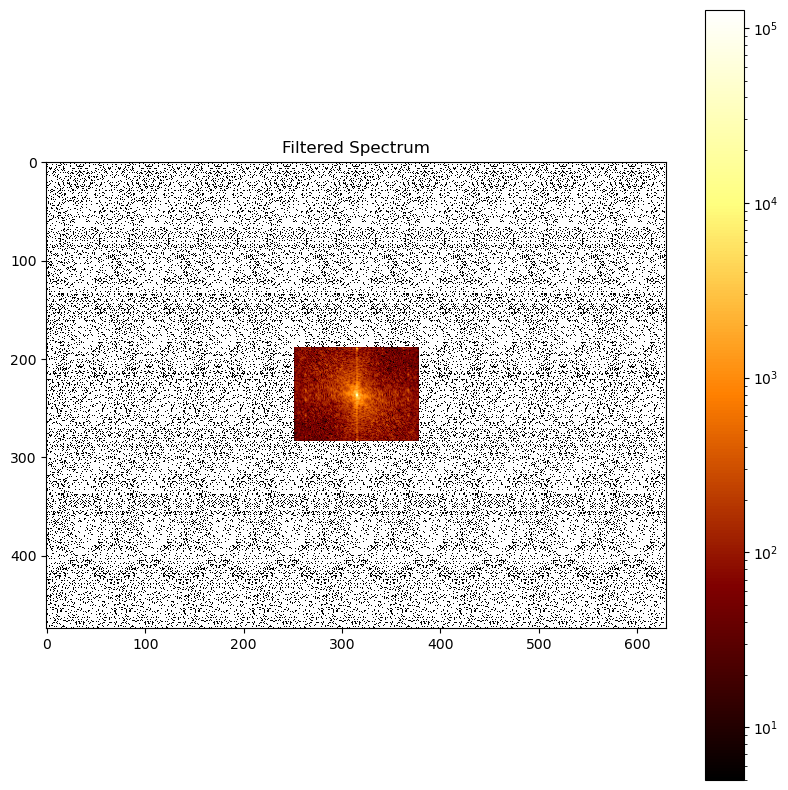

In [ ]:
# Copy the original spectrum and truncate coefficients.
# Define the fraction of coefficients (in each direction) to keep as
keep_fraction = 0.1
im_fft2 = im_fft.copy()
# Set r and c to the number of rows and columns of the array.
r, c = im_fft2.shape
# Set all rows to zero with indices between r*keep_fraction and r*(1-keep_fraction)
im_fft2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0
# Similarly with the columns
im_fft2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0
pylab.figure(), plot_spectrum(fftpack.fftshift(im_fft2)),pylab.title('Filtered Spectrum')

### Reconstructing the final image

Text(0.5, 1.0, 'Reconstructed Image')

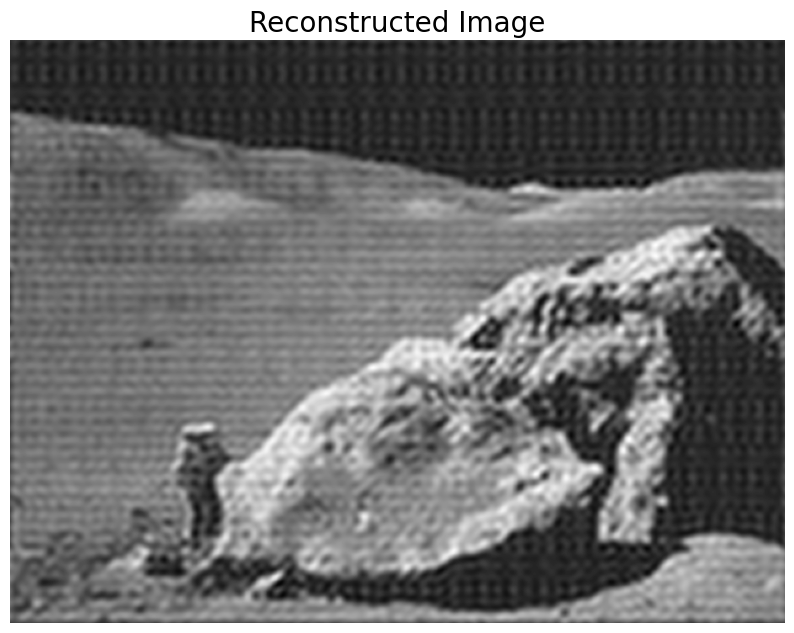

In [ ]:
# Reconstruct the denoised image from the filtered spectrum, keep only the real part for display.
im_new = fp.ifft2(im_fft2).real
pylab.figure(figsize=(10,10)), pylab.imshow(im_new, pylab.cm.gray),
pylab.axis('off')
pylab.title('Reconstructed Image', size=20)